In [ ]:
!pip install folium matplotlib mapclassify

In [397]:
import pandas as pd
import urllib
from urllib.request import urlopen
import json
import geopandas as gpd

In [398]:
url_tr_adm1=  "https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_TUR_1.json"
url_tr_adm2=  "https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_TUR_2.json"

Read the Turkey's shape files for Turkish administrative level cities (level 1) and district (level 2) from GADM. Displayed it as table and map. 

In [467]:
geo =gpd.read_file(url_tr_adm2)
geo.replace("Zinguldak", "Zonguldak",inplace=True)
geo.replace("M.Kemalpaşa", "MustafaKemalpaşa",inplace=True)
geo.replace("Ş.Karahisar", "ŞultanKarahisar",inplace=True)

geo

,GID_2,GID_0,COUNTRY,GID_1,NAME_1,NL_NAME_1,NAME_2,VARNAME_2,NL_NAME_2,TYPE_2,ENGTYPE_2,CC_2,HASC_2,geometry
0,TUR.1.1_1,TUR,Turkey,TUR.1_1,Adana,NA,Aladağ,NA,NA,District,District,NA,TR.AA.AL,"MULTIPOLYGON (((35.58970 37.94590, 35.56940 37..."
1,TUR.1.2_1,TUR,Turkey,TUR.1_1,Adana,NA,Ceyhan,NA,NA,District,District,NA,TR.AA.CE,"MULTIPOLYGON (((35.93400 36.87990, 35.92240 36..."
2,TUR.1.3_1,TUR,Turkey,TUR.1_1,Adana,NA,Feke,NA,NA,District,District,NA,TR.AA.FE,"MULTIPOLYGON (((35.64170 37.70990, 35.62810 37..."
3,TUR.1.4_1,TUR,Turkey,TUR.1_1,Adana,NA,İmamoğlu,NA,NA,District,District,NA,TR.AA.IM,"MULTIPOLYGON (((35.43950 37.30670, 35.45380 37..."
4,TUR.1.5_1,TUR,Turkey,TUR.1_1,Adana,NA,Karaisali,NA,NA,District,District,NA,TR.AA.KS,"MULTIPOLYGON (((35.09230 37.49990, 35.12020 37..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924,TUR.81.2_1,TUR,Turkey,TUR.81_1,Zonguldak,NA,Çaycuma,NA,NA,District,District,NA,TR.ZO.CA,"MULTIPOLYGON (((32.02100 41.56290, 32.03240 41..."
925,TUR.81.3_1,TUR,Turkey,TUR.81_1,Zonguldak,NA,Devrek,NA,NA,District,District,NA,TR.ZO.DE,"MULTIPOLYGON (((32.09200 41.01840, 31.91220 41..."
926,TUR.81.4_1,TUR,Turkey,TUR.81_1,Zonguldak,NA,Ereğli,NA,NA,District,District,NA,TR.ZO.ER,"MULTIPOLYGON (((31.73630 41.04270, 31.59990 41..."
927,TUR.81.5_1,TUR,Turkey,TUR.81_1,Zonguldak,NA,Gökçebey,NA,NA,District,District,NA,TR.ZO.GO,"MULTIPOLYGON (((32.24630 41.34900, 32.27430 41..."


<Axes: >

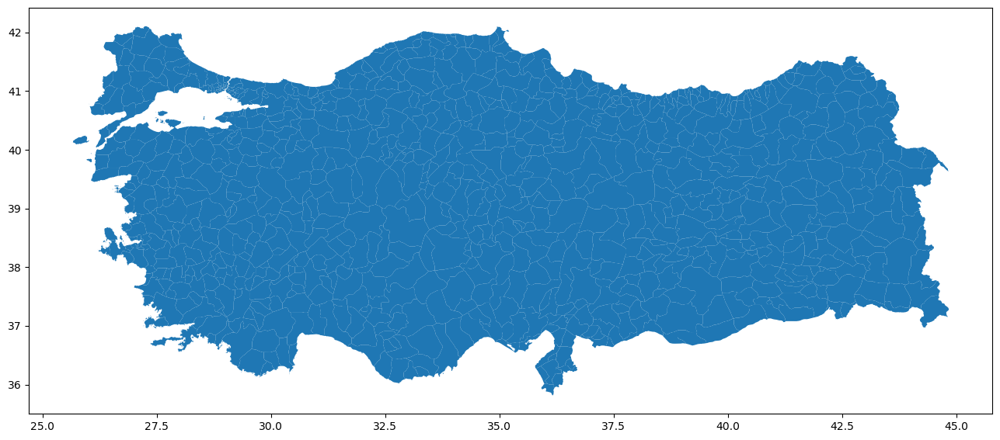

In [468]:
geo.plot(figsize=(16,8))

Got the population for cities and distincs from "https://biruni.tuik.gov.tr/nufusapp/idari.zul". Downloaded and read it. Table needs some cleaning since it incluedes titles and column names at the rows. 

In [469]:
population1 =pd.read_excel("C:/Users/yaren/Downloads/HW2-Population-level1.xlsx")
population1

,Column1,Column2,Column3,Column4,Column5,Column6,Column7
0,TÜRKİYE İSTATİSTİK KURUMU,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2000 GENEL NÜFUS SAYIMI VERİ TABANI,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
950,NaN,NaN,Çilimli,NaN,7.147,3.717,3.43
951,NaN,NaN,Gölyaka,NaN,8.572,4.388,4.184
952,NaN,NaN,Gümüşova,NaN,12.103,6.101,6.002
953,NaN,NaN,Kaynaşlı,NaN,9.439,5.27,4.169


Deleted first 7 rows since they are irrelevant. And changed the row at index 7 to column names.  

In [470]:
population1=population1[7:]
population1.columns = population1.iloc[0]
population1=population1[2:]
population1

7,NaN,İl,İlçe,Alt kademe,Toplam,Erkek,Kadın
9,NaN,Adana,Seyhan,NaN,807.934,396.728,411.206
10,NaN,NaN,Yüreğir,NaN,322.776,161.362,161.414
11,NaN,NaN,Aladağ,NaN,6.674,3.299,3.375
12,NaN,NaN,Ceyhan,NaN,108.602,54.875,53.727
13,NaN,NaN,Feke,NaN,4.632,2.393,2.239
...,...,...,...,...,...,...,...
950,NaN,NaN,Çilimli,NaN,7.147,3.717,3.43
951,NaN,NaN,Gölyaka,NaN,8.572,4.388,4.184
952,NaN,NaN,Gümüşova,NaN,12.103,6.101,6.002
953,NaN,NaN,Kaynaşlı,NaN,9.439,5.27,4.169


There are rows that have "Alt kademe" value and their distinct names are null. I changed them as 'Merkez' and wanted to group them to have only one 'Merkez' distinct value for each cities. But there were a problem with not having city names values at the rows. Only the first one for each city had it. I handled this problem with usinf 'ffill' method which fills NA/NaN values by propagating the last valid observation to next valid.

In [471]:
#population1[population1['İlçe'].isnull()]

In [472]:
df_pop = pd.DataFrame(population1)

In [473]:
df_pop = df_pop.iloc[:, 1:]
df_pop= df_pop.drop(columns=['Alt kademe'])
df_pop

7,İl,İlçe,Toplam,Erkek,Kadın
9,Adana,Seyhan,807.934,396.728,411.206
10,NaN,Yüreğir,322.776,161.362,161.414
11,NaN,Aladağ,6.674,3.299,3.375
12,NaN,Ceyhan,108.602,54.875,53.727
13,NaN,Feke,4.632,2.393,2.239
...,...,...,...,...,...
950,NaN,Çilimli,7.147,3.717,3.43
951,NaN,Gölyaka,8.572,4.388,4.184
952,NaN,Gümüşova,12.103,6.101,6.002
953,NaN,Kaynaşlı,9.439,5.27,4.169


In [474]:
df_pop[['Toplam', 'Erkek', 'Kadın']] = df_pop[['Toplam', 'Erkek', 'Kadın']].apply(pd.to_numeric)
df_pop

7,İl,İlçe,Toplam,Erkek,Kadın
9,Adana,Seyhan,807.934,396.728,411.206
10,NaN,Yüreğir,322.776,161.362,161.414
11,NaN,Aladağ,6.674,3.299,3.375
12,NaN,Ceyhan,108.602,54.875,53.727
13,NaN,Feke,4.632,2.393,2.239
...,...,...,...,...,...
950,NaN,Çilimli,7.147,3.717,3.430
951,NaN,Gölyaka,8.572,4.388,4.184
952,NaN,Gümüşova,12.103,6.101,6.002
953,NaN,Kaynaşlı,9.439,5.270,4.169


In [475]:
df_pop['İl']= df_pop['İl'].fillna(method='ffill')
df_pop['İlçe']= df_pop['İlçe'].fillna(method='ffill')
df_pop

7,İl,İlçe,Toplam,Erkek,Kadın
9,Adana,Seyhan,807.934,396.728,411.206
10,Adana,Yüreğir,322.776,161.362,161.414
11,Adana,Aladağ,6.674,3.299,3.375
12,Adana,Ceyhan,108.602,54.875,53.727
13,Adana,Feke,4.632,2.393,2.239
...,...,...,...,...,...
950,Düzce,Çilimli,7.147,3.717,3.430
951,Düzce,Gölyaka,8.572,4.388,4.184
952,Düzce,Gümüşova,12.103,6.101,6.002
953,Düzce,Kaynaşlı,9.439,5.270,4.169


In [476]:
df_pop= df_pop.reset_index(drop=True)
df_pop

7,İl,İlçe,Toplam,Erkek,Kadın
0,Adana,Seyhan,807.934,396.728,411.206
1,Adana,Yüreğir,322.776,161.362,161.414
2,Adana,Aladağ,6.674,3.299,3.375
3,Adana,Ceyhan,108.602,54.875,53.727
4,Adana,Feke,4.632,2.393,2.239
...,...,...,...,...,...
941,Düzce,Çilimli,7.147,3.717,3.430
942,Düzce,Gölyaka,8.572,4.388,4.184
943,Düzce,Gümüşova,12.103,6.101,6.002
944,Düzce,Kaynaşlı,9.439,5.270,4.169


In [477]:
df_pop.index.name = None
df_pop.columns.name = None

In [478]:
#result = df_pop.groupby(['İl','İlçe'])["Toplam"].sum()
df_result = df_pop.groupby(['İl','İlçe'],as_index=False).sum()

df_result

,İl,İlçe,Toplam,Erkek,Kadın
0,Adana,Aladağ,6.674,3.299,3.375
1,Adana,Ceyhan,108.602,54.875,53.727
2,Adana,Feke,4.632,2.393,2.239
3,Adana,Karaisalı,6.883,3.500,3.383
4,Adana,Karataş,9.189,4.597,4.592
...,...,...,...,...,...
918,Şırnak,Güçlükonak,4.111,2.498,1.613
919,Şırnak,Merkez,52.743,30.758,21.985
920,Şırnak,Silopi,51.199,27.759,23.440
921,Şırnak,Uludere,7.928,4.313,3.615


In [479]:
df_result = df_result.sort_values(by=['İl','İlçe'])

In [480]:
df_result.rename(columns={'İlçe': 'NAME_2'},inplace=True)
df_result

,İl,NAME_2,Toplam,Erkek,Kadın
0,Adana,Aladağ,6.674,3.299,3.375
1,Adana,Ceyhan,108.602,54.875,53.727
2,Adana,Feke,4.632,2.393,2.239
3,Adana,Karaisalı,6.883,3.500,3.383
4,Adana,Karataş,9.189,4.597,4.592
...,...,...,...,...,...
918,Şırnak,Güçlükonak,4.111,2.498,1.613
919,Şırnak,Merkez,52.743,30.758,21.985
920,Şırnak,Silopi,51.199,27.759,23.440
921,Şırnak,Uludere,7.928,4.313,3.615


Muiltiplied the column values with 1000 because of the dot and comma confusion between languages. 

In [481]:
df_result.drop(columns = ["Erkek","Kadın"], inplace= True)
df_result["Toplam"]=df_result["Toplam"] * 1000
df_result

,İl,NAME_2,Toplam
0,Adana,Aladağ,6674.0
1,Adana,Ceyhan,108602.0
2,Adana,Feke,4632.0
3,Adana,Karaisalı,6883.0
4,Adana,Karataş,9189.0
...,...,...,...
918,Şırnak,Güçlükonak,4111.0
919,Şırnak,Merkez,52743.0
920,Şırnak,Silopi,51199.0
921,Şırnak,Uludere,7928.0


In [482]:
import geopandas


In [489]:

data = geo.merge(df_result[['NAME_2','Toplam']],on='NAME_2')
data = data.sort_values(by=['NAME_1','NAME_2'])

Text(0.5, 1.0, 'Türkiye, İlçe Bazlı Nüfus')

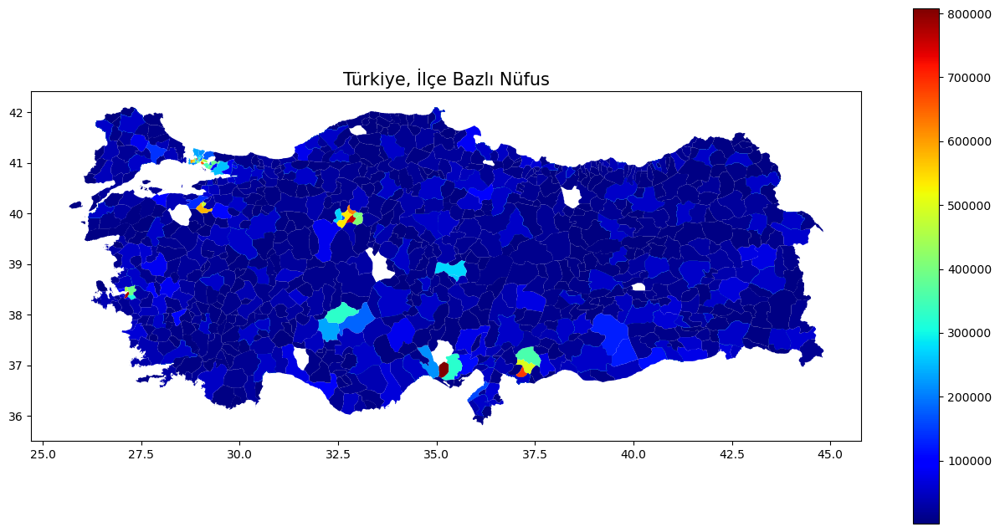

In [490]:
import matplotlib.pyplot as plt

data.plot(column='Toplam',figsize=(16,8),cmap='jet',legend=True)
plt.title("Türkiye, İlçe Bazlı Nüfus", fontdict={"fontsize": 15}, pad=5)

In [498]:
data.explore(
    column="NAME_2",  # make choropleth based on "BoroName" column
    tooltip=["NAME_2", "Toplam"],  # show "BoroName" value in tooltip (on hover)
    popup=["NAME_1", "NAME_2", "Toplam"],  # show selected values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="Set1",  # use "Set1" matplotlib colormap
    style_kwds=dict(color="black"),  # use black outline
)